# Visualise results of louvain community detection subject to different modularity definitions. 
All the results visualised in this script are produced using Matlab. See directory: gen_matlab/

In [2]:
import numpy as np
import pandas as pd
import igraph as ig

In [3]:
tobys_dir = 'C:/Users/KiraPc/Dropbox/topic modelling/data/itn directed network from toby/'
results_dir = 'C:/Users/KiraPc/Dropbox/network clustering/louvain community/louvain_matlab/'

In [3]:
# Load vertex ids
node_ids = []
with open(results_dir + 'data/netnodes_vocab.csv','r') as infile:
    for row in infile:
        node_id = row.rstrip()
        node_ids.append(node_id)

In [4]:
# Load street network
g = ig.load(tobys_dir + 'camden_buff100_physical.graphml')

In [5]:
from cPickle import load, dump
with open(tobys_dir + 'camden_buff100_node_positions.pkl','r') as infile:
    node_positions = load(infile)
with open(tobys_dir + 'camden_buff100_edge_polylines_kira.pkl','r') as infile:
    edge_polylines = load(infile)

In [6]:
# Add x,y to nodes
for vertex in g.vs:
    fid = vertex['id']
    vertex['x'] = node_positions[fid][0]
    vertex['y'] = -node_positions[fid][1]

In [7]:
# Base graph
ig.plot(g,vertex_size=0)

In [8]:
g.es[10]

igraph.Edge(<igraph.Graph object at 0x000000000A2B6A98>, 10, {'natureOfRoad': 'Single Carriageway', 'gradeSeparation_neg': '0', 'fid': 'osgb4000000030250331', 'one_way': '', 'orientation_neg': 'osgb4000000030003461_0', 'descriptiveTerm': 'Minor Road', 'length': 61.03, 'key': 'osgb4000000030250331', 'orientation_pos': 'osgb4000000030003472_0', 'gradeSeparation_pos': '0'})

# Based on gen_louvain code

In [1]:
import numpy as np
import pandas as pd
import igraph as ig

In [2]:
tobys_dir = 'C:/Users/KiraPc/Dropbox/topic modelling/data/itn directed network from toby/'
results_dir = 'C:/Users/KiraPc/Dropbox/network clustering/louvain community/gen_louvain/'

In [3]:
# Load vertex ids
node_ids = []
with open(results_dir + 'data/netnodes_vocab.csv','r') as infile:
    for row in infile:
        node_id = row.rstrip()
        node_ids.append(node_id)

In [4]:
# Load street network
g = ig.load(tobys_dir + 'camden_buff100_physical.graphml')

In [5]:
from cPickle import load, dump
with open(tobys_dir + 'camden_buff100_node_positions.pkl','r') as infile:
    node_positions = load(infile)
with open(tobys_dir + 'camden_buff100_edge_polylines_kira.pkl','r') as infile:
    edge_polylines = load(infile)

In [6]:
# Add x,y to nodes
for vertex in g.vs:
    fid = vertex['id']
    vertex['x'] = node_positions[fid][0]
    vertex['y'] = -node_positions[fid][1]

In [7]:
# Base graph
ig.plot(g,vertex_size=0)

In [8]:
ig.color_name_to_rgba("white")

(1.0, 1.0, 1.0, 1.0)

In [9]:
for edge in g.es:
    edge['color'] = (1.0, 1.0, 1.0, 0.8)

In [10]:
plot = ig.plot(g,vertex_size=0)
plot.background = None
plot.redraw()

In [162]:
plot.save('camden_street_network.png')

## Definition 1: standard modularity score

In [11]:
# Create a dict storing community assignments
nodes_com1 = {}
coms_def1 = []
with open(results_dir+'results/com_def1.csv','r') as infile:
    for i,row in enumerate(infile):
        com = int(row.rstrip())
        coms_def1.append(com)
        nodes_com1[node_ids[i]] = com   

In [12]:
no_communities_def1 = len(np.unique(coms_def1))

In [13]:
# Shuffle community labels
import random

In [14]:
community_labels = range(1,no_communities_def1+1)
community_labels_shuffled = list(community_labels)
random.shuffle(community_labels_shuffled)

In [19]:
no_communities_def1 

1023

In [15]:
community_mapping = {}
for i, label in enumerate(community_labels):
    community_mapping[label] = community_labels_shuffled[i]

In [16]:
# Visualise results
pal = ig.RainbowPalette(n=no_communities_def1,s=1,v=0.9)
for vertex in g.vs:
    fid = vertex['id']
    vertex['com_def1'] = pal[community_mapping[nodes_com1[fid]]-1]  # com indexing starts from 1

In [17]:
ig.plot(g, vertex_size=9,vertex_color = [col for col in g.vs['com_def1']])#, edge_width = [x/100 for x in g.es["weight"]])

In [25]:
# Colour edges by community membership instead of nodes

In [33]:
community_mapping

{1: 561,
 2: 689,
 3: 468,
 4: 931,
 5: 982,
 6: 946,
 7: 255,
 8: 199,
 9: 795,
 10: 885,
 11: 867,
 12: 534,
 13: 913,
 14: 1002,
 15: 195,
 16: 928,
 17: 222,
 18: 909,
 19: 285,
 20: 932,
 21: 166,
 22: 472,
 23: 445,
 24: 268,
 25: 542,
 26: 781,
 27: 762,
 28: 308,
 29: 645,
 30: 297,
 31: 134,
 32: 911,
 33: 130,
 34: 288,
 35: 507,
 36: 49,
 37: 443,
 38: 273,
 39: 332,
 40: 697,
 41: 920,
 42: 234,
 43: 391,
 44: 28,
 45: 917,
 46: 360,
 47: 415,
 48: 613,
 49: 941,
 50: 874,
 51: 446,
 52: 263,
 53: 618,
 54: 895,
 55: 570,
 56: 552,
 57: 945,
 58: 787,
 59: 373,
 60: 773,
 61: 641,
 62: 139,
 63: 745,
 64: 861,
 65: 589,
 66: 843,
 67: 101,
 68: 34,
 69: 10,
 70: 202,
 71: 456,
 72: 218,
 73: 12,
 74: 198,
 75: 912,
 76: 969,
 77: 201,
 78: 229,
 79: 294,
 80: 238,
 81: 1014,
 82: 763,
 83: 666,
 84: 194,
 85: 15,
 86: 102,
 87: 978,
 88: 69,
 89: 242,
 90: 372,
 91: 846,
 92: 313,
 93: 92,
 94: 617,
 95: 46,
 96: 737,
 97: 899,
 98: 379,
 99: 479,
 100: 63,
 101: 382,
 102:

In [52]:
for edge in g.es:
    comS = nodes_com1[g.vs[edge.source]['id']]
    comT = nodes_com1[g.vs[edge.target]['id']]
    if comS!=comT:
        edge['color'] = (0.0, 0.0, 0.0, 0.0)
    else:
#         edge['color'] = pal[community_mapping[comS]-1] 
        if comS==8:
            edge['color'] = pal[community_mapping[comS]-1] 
            edge['width'] = 4
        else:
            edge['color'] = (0.0, 0.0, 0.0, 0.0)

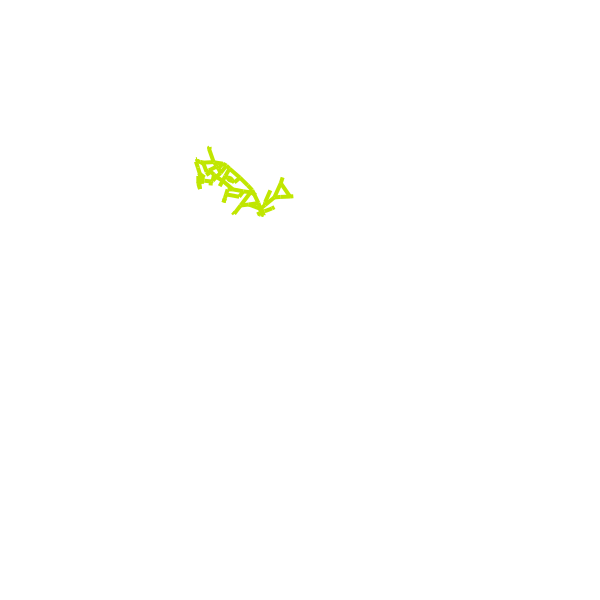

In [53]:
ig.plot(g, vertex_size=0)

In [54]:
plot = ig.plot(g,vertex_size=0,bbox=(2000,2000))
plot.background = None
plot.redraw()

In [55]:
plot.save('com_def1_com8.png')

In [93]:
# Plot largest X clusters
import collections
counter=collections.Counter(coms_def1)

In [94]:
coms = []
counts = []
for com, count in counter.items():
    coms.append(com)
    counts.append(count)

In [95]:
counts_sorted, coms_sorted = zip(*sorted(zip(counts, coms),reverse=True))

In [96]:
counts_sorted.index(2)

86

In [97]:
x_largest = coms_sorted[0:6]

In [81]:
for edge in g.es:
    comS = nodes_com1[g.vs[edge.source]['id']]
    comT = nodes_com1[g.vs[edge.target]['id']]
    if comS==comT and comS in x_largest:
        edge['color'] = pal[community_mapping[comS]-1] 
        edge['width'] = 1.5
    else:
        edge['color'] = (0.7450980392156863, 0.7450980392156863, 0.7450980392156863, 0.5)
        edge['width'] = 0.5

In [82]:
ig.plot(g, vertex_size=0)

In [83]:
plot = ig.plot(g,vertex_size=0)
plot.background = None
plot.redraw()

In [84]:
plot.save('com_def1_6largest.png')

## Definition 2: a'network modularity score

In [23]:
# Create a dict storing community assignments
nodes_com2 = {}
coms_def2 = []
with open(results_dir+'results/com_def2.csv','r') as infile:
    for i,row in enumerate(infile):
        com = int(row.rstrip())
        coms_def2.append(com)
        nodes_com2[node_ids[i]] = com

In [24]:
no_communities_def2 = len(np.unique(coms_def2))

In [25]:
# Shuffle labels for plotting
community_labels = range(1,no_communities_def2+1)
community_labels_shuffled = list(community_labels)
random.shuffle(community_labels_shuffled)

In [26]:
community_mapping = {}
for i, label in enumerate(community_labels):
    community_mapping[label] = community_labels_shuffled[i]

In [27]:
# Visualise results
pal = ig.RainbowPalette(n=no_communities_def2,s=1,v=0.9)
for vertex in g.vs:
    fid = vertex['id']
    vertex['com_def2'] = pal[community_mapping[nodes_com2[fid]]-1]  # com indexing starts from 1

In [28]:
ig.plot(g, vertex_size=9,vertex_color = [col for col in g.vs['com_def2']])#, edge_width = [x/100 for x in g.es["weight"]])

In [62]:
# Color edges instead of nodes

In [63]:
for edge in g.es:
    comS = nodes_com2[g.vs[edge.source]['id']]
    comT = nodes_com2[g.vs[edge.target]['id']]
    if comS!=comT:
        edge['color'] = (0.0, 0.0, 0.0, 0.0)
        #edge['color'] = 'grey'
    else:
        edge['color'] = pal[community_mapping[comS]-1] 
        edge['width'] = 1.5

In [64]:
for edge in g.es:
    comS = nodes_com2[g.vs[edge.source]['id']]
    edge['color'] = pal[community_mapping[comS]-1] 
    edge['width'] = 1.5

In [65]:
ig.plot(g, vertex_size=0)

In [118]:
plot = ig.plot(g,vertex_size=0)
plot.background = None
plot.redraw()

In [119]:
plot.save('com_def2_v2.png')

In [66]:
# Plot largest X clusters
import collections
counter=collections.Counter(coms_def2)

In [67]:
coms = []
counts = []
for com, count in counter.items():
    coms.append(com)
    counts.append(count)

In [68]:
counts_sorted, coms_sorted = zip(*sorted(zip(counts, coms),reverse=True))

In [69]:
counts_sorted.index(2)

140

In [70]:
x_largest = coms_sorted[0:11]

In [71]:
x_largest 

(6, 3, 39, 190, 140, 183, 17, 80, 185, 186, 273)

In [72]:
x_largest = [3, 39, 190, 140, 183, 17, 80, 185, 186, 273] 

In [97]:
for edge in g.es:
    comS = nodes_com2[g.vs[edge.source]['id']]
    comT = nodes_com2[g.vs[edge.target]['id']]
    if comS==comT and comS in [140]:     #x_largest:
        edge['color'] = pal[community_mapping[comS]-1] 
        edge['width'] = 4     #1.5
    else:
        edge['color'] = (0.7450980392156863, 0.7450980392156863, 0.7450980392156863, 0.5)
        edge['width'] = 0      #0.5

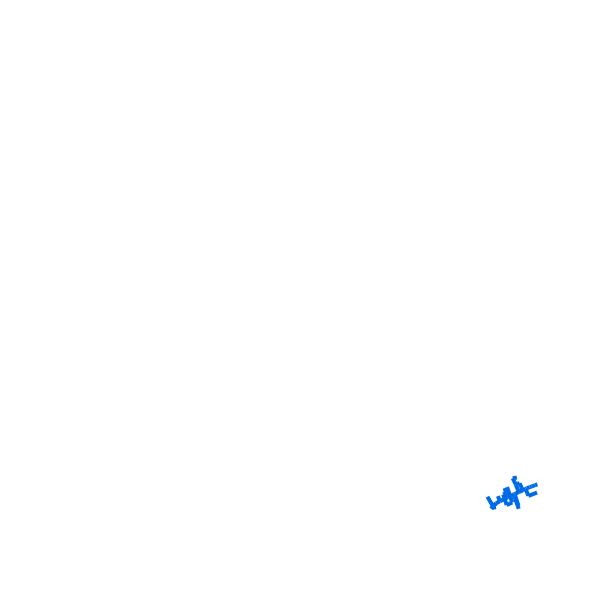

In [98]:
ig.plot(g, vertex_size=0)

In [99]:
plot = ig.plot(g,vertex_size=0,bbox=(2000,2000))
plot.background = None
plot.redraw()

In [100]:
plot.save('com_def2_com140.png')

In [101]:
pal = ig.RainbowPalette(n=no_communities_def2,s=1,v=0.9)
for vertex in g.vs:
    fid = vertex['id']
    com_orig_no = nodes_com2[fid]    # community number before shuffling
    if com_orig_no in x_largest:
        count += 1
        vertex['com_def2'] = pal[community_mapping[com_orig_no]-1]  # com indexing starts from 1
    else:
        vertex['com_def2'] = (0.9, 0.5, 0.0, 0)

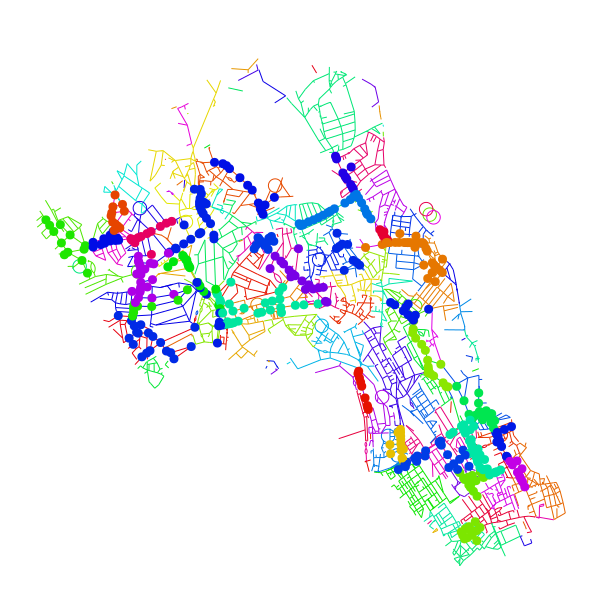

In [102]:
ig.plot(g, vertex_size=9,vertex_color = [col for col in g.vs['com_def2']],vertex_frame_width=0)#, edge_width = [x/100 for x in g.es["weight"]])